In [1]:
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd


In [7]:
# Based on source from http://stackoverflow.com/questions/38263313/radial-grids-must-be-strictly-positive-error-on-radar-chart
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
AX_MIN_VALUE = 0.1
AX_MAX_VALUE = 0.7  # leave extra room for axis labels that may be long
def _invert(x, limits):
    """inverts a value x on a scale from
    limits[0] to limits[1]"""
    return limits[1] - (x - limits[0])
def _scale_data(data, ranges):
    result = []
    for d, (y1, y2) in zip(data, ranges):
        try:
            assert (y1 <= d <= y2) or (y2 <= d <= y1)
        except AssertionError:
            print(d,y1,y2)
        result.append((d-y1)/(y2-y1)*(AX_MAX_VALUE-AX_MIN_VALUE) + AX_MIN_VALUE) # This is the formula to convert between 2 scales
    return result
class ComplexRadar():
    def __init__(self, fig, variables, ranges,
                 n_ordinate_levels=6, precision=2, textsize="smaller", numberssize="smaller", textposrate=1.08, textposrotation=60):
        angles = np.arange(0, 360, 360./len(variables))
        axes = [fig.add_axes([AX_MIN_VALUE,AX_MIN_VALUE,AX_MAX_VALUE,AX_MAX_VALUE],polar=True,
                label = "axes{}".format(i))
                for i in range(len(variables))]
        #mqm - apparently axes[0] is the circle perimeter, with the var names
        l, text = axes[0].set_thetagrids(angles,
                                         labels=variables,
                                         #frac=textposrate, #no longer exists
                                         horizontalalignment='left',
                                         position=(0.1,1-textposrate),
                                         size=textsize)
        #Rotation is a mistery in newer versions of matplotlib
        # was: [txt.set_rotation(angle - textposrotation) for txt, angle in zip(text, angles)]
        #works but same value for all. Useless
        #axes[0].tick_params(axis='x', labelrotation=60)
        #does not work
        #[txt.set_rotation(angle-textposrotation) for txt, angle in zip(text, angles)]
        #does not work
        #locs, labels = axes[0].get_xticks()
        #[label.set_rotation(180) for label in labels]
        #does not work
        #for label,angle in zip (axes[0].get_xticklabels(), angles): # https://stackoverflow.com/questions/43152502/how-can-i-rotate-xticklabels-in-matplotlib-so-that-the-spacing-between-each-xtic
        #    #label.set_ha("left") # works
        #    label.set_rotation(angle-textposrotation) # does not work
        for ax in axes[1:]:
            ax.patch.set_visible(False)
            ax.grid(False)
            ax.xaxis.set_visible(False)
        for i, ax in enumerate(axes):
            grid = np.linspace(*ranges[i],
                               num=n_ordinate_levels)
            adjusted_range = [(AX_MIN_VALUE,AX_MAX_VALUE) for i in range(len(ranges))] # radial grids must be strictly positive in matplotlib
            adjusted_grid = np.linspace(*adjusted_range[i],
                               num=n_ordinate_levels)
            gridlabel = ["{}".format(round(x,precision))
                         for x in grid]
            if ranges[i][0] > ranges[i][1]:
                grid = grid[::-1] # hack to invert grid
                          # gridlabels aren't reversed
            gridlabel[0] = "" # clean up origin
            ax.set_rgrids(adjusted_grid, labels=gridlabel,
                         angle=angles[i], size=numberssize)
            #ax.spines["polar"].set_visible(False)
            ax.set_ylim(*adjusted_range[i])
        # variables for plotting
        self.angle = np.deg2rad(np.r_[angles, angles[0]])
        self.ranges = ranges
        self.ax = axes[0]
    def plot(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.plot(self.angle, np.r_[sdata, sdata[0]], *args, **kw)
    def fill(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.fill(self.angle, np.r_[sdata, sdata[0]], *args, **kw)

In [3]:
# SVM = [0.682, 0.818, 0, 0.669, 0.729, 0.792]
# MGCN = [0.552, 0.707, 0, 0.634, 0.85, 0.738]
# Hu_et_all = [0.627, 0.781, 0, 0.726, 0.687, 0.799]
# df_ = {
#     'MoleculeNet': [0.684, 0.829, 0.742, 0.832, 0.729, 0.792, 0.58, 1.15, 0.655],
#     'ChemBERTa': [0, 0, 0, 0, 0.643, 0.622, 0, 0, 0],
#     'D_MPNN': [0, 0, 0, 0.906, 0.913, 0.816, 0, 0, 0 ],
#     "GROVER_large": [0.658, 0.831, 0.737, 0.944, 0.94, 0, 0.831, 1.544, 0.56 ],
#     "Chemformer": [0, 0, 0, 0, 0, 0, 0.633, 1.23, 0.598],
#     "MolFormer_Xl": [0.69, 0.847, 0, 0.948, 0.937, 0.822, 0.879, 0.231, 0.529],
#     "MolCLR": [0.68, 0.798, 0, 0.932, 0.736, 0.806, 1.11, 2.2, 0.65],
#     "iMolCLR": [0.699, 0.799, 0, 0.954, 0.764, 0.808, 1.13, 2.09, 0.64],
#     "Attentive_FP": [0.637, 0.858, 0.805, 0.94, 0.92, 0.832, 0.736, 0.503, 0.578],
#     "RF": [0.684, 0.769, 0, 0.713, 0.714, 0.781, 1.07, 2.03, 0.88]

# }


image.png

In [ ]:
model_names = ["MoleculeNet GC", 'ChemBERTa', 'D_MPNN', "GROVER_large", "Chemformer",  "MolFormer_Xl", "MolCLR", "iMolCLR", "Attentive_FP", "RF MOlCLR", "SVM MolCLR"]

MoleculeNet =   [0.638, 0.829, 0.716, 0.807, 0.783, 0.763, 0.783, 0.97, 1.4, 0.655]
ChemBERTa =     [0.52, ,  , , 0.643, 0.622, , , , ]
D_MPNN =        [, ,  , , , 0.816, 0.875, , , ]
GROVER_large =  [0.658, 0.831, 0.737, 0.944, , , 0.894, 0.831, 1.544, 0.56 ]
MolFormer_Xl =  [0.69, 0.847, , 0.948, , 0.822, 0.882, 0.279, 0.231, 0.529]
MolCLR =        [0.68, 0.798, , 0.932, 0.736, 0.806, 0.89, 1.11, 2.2, 0.65 ]
iMolCLR =       [0.699, 0.799, , 0.954, 0.764, 0.808, 0.885, 1.13, 2.09, 0.64]
Attentive_FP =  [0.637, 0.858, 0.805, 0.94, , , , 0.503, 0.736, 0.578]
RF =            [0.684, 0.769, , 0.713, 0.714, 0.781, 0.867, 1.07, 2.03, 0.88]
SVM =           [0.682, 0.818, , 0.669, 0.729, 0.792, 0.862, 1.5, 3.14, 0.82]
MGCN =          [0.552, 0.707, , 0.634, 0.85, 0.738, 0.734, 1.27, 3.35, 1.11]
Chemformer =    [, , , , , , , 0.633, 1.23, 0.598]
# YerevaNN = [0.593, 0.784, 0.825, 0.999, 0.739, 0.749, 0.854, 0.117, 0.173, 0.3]
YerevanN_SWA = [0.705, 0.851, 0.825, 0.997, 0.74, 0.745, 0.855, 0.095, 0.114, 0.292]

data = [["SIDER", "Tox21", "ToxCast", "ClinTox", "BBBP", "HIV", "BACE", "ESOL", "FreeSolv", "Lipophilicity"],
        [ MoleculeNet, ChemBERTa, D_MPNN, GROVER_large, Chemformer, MolFormer_Xl, MolCLR, iMolCLR, Attentive_FP, RF, SVM, MGCN, YerevaNN, YerevanN_SWA ]]

In [ ]:
# data
# for i in data[1]:
#     print(len(i))
# data[0]


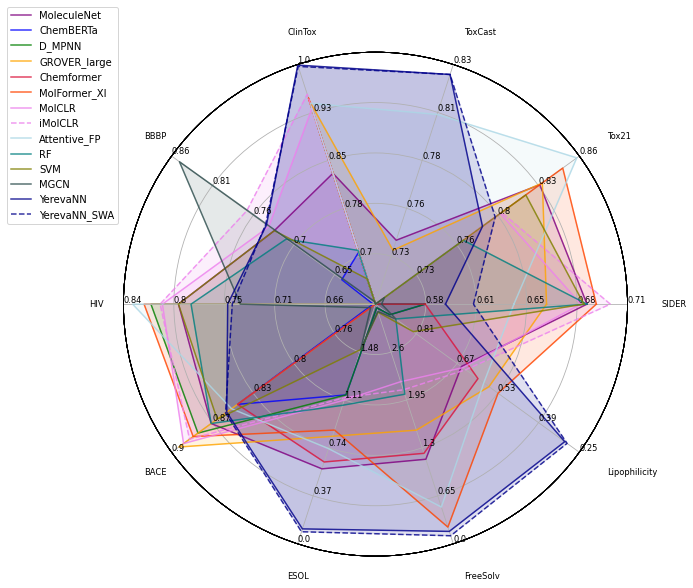

In [ ]:
variables = data[0]

ranges = [(0.52, 0.72), (0.7, 0.86), (0.71, 0.83),
         (0.63, 1), (0.6, 0.86), (0.62, 0.84), (0.73, 0.9), (1.85, 0.002), (3.25, 0.005), (0.95, 0.25)]   

model_names = ["MoleculeNet", 'ChemBERTa', 'D_MPNN', "GROVER_large", "Chemformer", "MolFormer_Xl", "MolCLR", "iMolCLR", "Attentive_FP", "RF", "SVM", "MGCN", "YerevaNN", "YerevaNN_SWA"]

        
# plotting
fig1 = plt.figure(figsize=(13, 10))
radar = ComplexRadar(fig1, variables, ranges)

col = ["purple", "blue", "green", "orange", "crimson", "orangered", "violet", "violet", "lightblue", "teal", "olive", "darkslategrey", "darkblue"]
for i in range(len(data[1])):
      if model_names[i] == "YerevaNN_SWA":
            radar.fill(data[1][-1], color=col[-1], alpha=0.12)

            radar.plot(data[1][i], color=col[-1], linestyle="dashed", label=model_names[i], alpha=0.8)
      elif model_names[i] == "iMolCLR":
            radar.fill(data[1][i], color=col[i], alpha=0.12)

            radar.plot(data[1][i], color=col[i], linestyle="dashed", label=model_names[i], alpha=0.8)

      else:
            radar.fill(data[1][i], color=col[i], alpha=0.12)

            radar.plot(data[1][i], color=col[i], label=model_names[i], alpha=0.8)
radar.ax.legend(bbox_to_anchor=(0, 1.1))

# fig.suptitle(title, x=0.1, y=1.16, fontsize=20, color='#444444')
# radar.ax.legend(loc='center right', bbox_to_anchor=(0.9, 1.10),
#       fancybox=False, shadow=False, ncol=48)
# 'best', 'upper right', 'upper left', 'lower left', 'lower right', 'right', 'center left', 'center right', 'lower center', 'upper center', 'center'
plt.show()   
fig1.savefig("cycle.pdf")
fig1.savefig("cycle.png")

In [5]:
# data
# model_names = ["MoleculeNet", 'ChemBERTa', 'D_MPNN', "GROVER_large", "MolFormer_Xl", "MolCLR", "iMolCLR", "Attentive_FP", "RF"]
# dt = ["SIDER", "Tox21", "ToxCast", "ClinTox", "BBBP", "HIV", "BACE"]

# MoleculeNet = [0.684, 0.829, 0.742, 0.832, 0.729, 0.792, 0.867]
# ChemBERTa = [0, 0, 0, 0, 0.643, 0.622, 0]
# D_MPNN = [0, 0, 0, 0.906, 0.913, 0.816, 0.878 ]
# GROVER_large = [0.658, 0.831, 0.737, 0.944, 0.94, 0, 0.894 ]
# MolFormer_Xl = [0.69, 0.847, 0, 0.948, 0.937, 0.822, 0.882]
# MolCLR = [0.68, 0.798, 0, 0.932, 0.736, 0.806, 0.89 ]
# iMolCLR = [0.699, 0.799, 0, 0.954, 0.764, 0.808, 0.885]
# Attentive_FP = [0.637, 0.858, 0.805, 0.94, 0.92, 0.832, 0.85]
# RF = [0.684, 0.769, 0, 0.713, 0.714, 0.781, 0.867]
# SVM = [0.682, 0.818, 0, 0.669, 0.729, 0.792]
# MGCN = [0.552, 0.707, 0, 0.634, 0.85, 0.738]
# Hu_et_all = [0.627, 0.781, 0, 0.726, 0.687, 0.799]
# df_ = {
#     'MoleculeNet': [0.684, 0.829, 0.742, 0.832, 0.729, 0.792],
#     'ChemBERTa': [0, 0, 0, 0, 0.643, 0.622],
#     'D_MPNN': [0, 0, 0, 0.906, 0.913, 0.816 ],
#     "GROVER_large": [0.658, 0.831, 0.737, 0.944, 0.94, 0 ],
#     "MolFormer_Xl": [0.69, 0.847, 0, 0.948, 0.937, 0.822],
#     "MolCLR": [0.68, 0.798, 0, 0.932, 0.736, 0.806],
#     "iMolCLR": [0.699, 0.799, 0, 0.954, 0.764, 0.808],
#     "Attentive_FP": [0.637, 0.858, 0.805, 0.94, 0.92, 0.832],
#     "RF": [0.684, 0.769, 0, 0.713, 0.714, 0.781]

}

data = [["SIDER", "Tox21", "ToxCast", "ClinTox", "BBBP", "HIV", "BACE"],
        [ MoleculeNet, ChemBERTa, D_MPNN, GROVER_large, MolFormer_Xl, MolCLR, iMolCLR, Attentive_FP, RF ]]

In [7]:
from rdkit.Chem.Scaffolds.MurckoScaffold import MurckoScaffoldSmiles
from fairseq.data.data_utils import load_indexed_dataset
from fairseq.models.bart import BARTModel
from fairseq.data import Dictionary
import torch.nn.functional as F 
import matplotlib.pyplot as plt
from pathlib import Path
from rdkit import Chem
from tqdm import tqdm
import torch.nn as nn
import pandas as pd
import numpy as np
import logging
import torch
import json
import umap
import os
import os 
os.system['MKL_THREADING_LAYER'] = 'GNU'
os.system('CUDA_LAUNCH_BLOCKING=1')
# os.environ["PYTORCH_CUDA_ALLOC_CONF"]="5"
dataset_name = 'BBBP'
# dataset = dataset_name if dataset_name in set(["BBBP", "BACE", "HIV"]) else f"{dataset_name}_{args.subtask}"
dataset = dataset_name

store_path = "/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data"
model = f"{store_path}/{dataset}/processed"

with open('/home/gayane/BartLM/captum/fairseq/scripts/datasets.json') as f:
    datasets_json = json.load(f)
dataset_js = datasets_json[dataset]
task_type = dataset_js['type']

if task_type == "regression":
    mi = dataset_js['minimum']
    ma = dataset_js['maximum']

os.system(f"mkdir -p {store_path}/{dataset}/")
os.system(f"mkdir -p {store_path}/{dataset}/processed/")
os.system(f"mkdir -p {store_path}/{dataset}/processed/input0/")
os.system(f"mkdir -p {store_path}/{dataset}/processed/label/")

warmup = 163
totNumUpdate = 1020
lr = '3e-5'
chkpt_path = '/mnt/good/gayane/data/chkpt/BBBP_bs_16_dropout_0.1_lr_3e-5_totalNum_1020_warmup_163_noise_type_uniform_r3f_lambda_1.0/checkpoint_best.pt'
# chkpt_path = f"/mnt/good/gayane/data/chkpt/{dataset}_bs_16_lr_{lr}_totalNum_{totNumUpdate}_warmup_{warmup}/checkpoint_last.pt"
print(chkpt_path)  # BACE_bs_16_lr_3e-5_totalNum_1135_warmup_181/ in test 
bart = BARTModel.from_pretrained(model,  checkpoint_file = chkpt_path, 
                                 bpe="sentencepiece",
                                 sentencepiece_model="/home/gayane/BartLM/Bart/chemical/tokenizer/chem.model")

input_dict = Dictionary.load(f"{store_path}/{dataset}/processed/input0/dict.txt")

# string = bart.encode("NNCCc1ccccc1.O[S](O)(=O)=O")
# print(string)

# exit()

bart.eval()
bart.cuda(device=0)


data_type = 'train'

input_dict = Dictionary.load(f"{store_path}/{dataset}/processed/input0/dict.txt")
smiles = list(load_indexed_dataset(
    f"{store_path}/{dataset}/processed/input0/{data_type}", input_dict))


test_label_path = f"{store_path}/{dataset}/processed/label/{data_type}"

if task_type == 'classification':
    
    target_dict = Dictionary.load(f"{store_path}/{dataset}/processed/label/dict.txt")
    targets = list(load_indexed_dataset(test_label_path, target_dict))
elif task_type == 'regression':
    with open(f'{test_label_path}.label') as f:
        lines = f.readlines()
        targets = [float(x.strip()) for x in lines]
if task_type == 'classification':
    if len(dataset_js["class_index"])>1:
        target_dict = list()
        targets_list = list()
        for i in range(len(dataset_js["class_index"])):
            target_dict.append(Dictionary.load(f"{store_path}/{dataset}_{i}/processed/label/dict.txt"))
            targets_list.append(list(load_indexed_dataset(test_label_path[i], target_dict[i])))
        
    else: 
        target_dict = Dictionary.load(f"{store_path}/{dataset}/processed/label/dict.txt")
        targets = list(load_indexed_dataset(test_label_path, target_dict))
elif task_type == 'regression':
    with open(f'{test_label_path}.label') as f:
        lines = f.readlines()
        targets = [float(x.strip()) for x in lines]

# y_pred = []
# y = []
# sm = []
# for i, (smile, target) in tqdm(list(enumerate(zip(smiles, targets)))):
#     smile = torch.cat((torch.cat((torch.tensor([0]), smile[:126])), torch.tensor([2])))  
#     if task_type =="classification":
#         output = bart.predict('sentence_classification_head', smile)
#         target = target[0].item()
#         y_pred.append(output[0][1].exp().item())
#         y.append(target - 4)
#         sm.append(bart.decode(smile))
        
#     elif task_type == "regression":
#         output = bart.predict('sentence_classification_head', smile, return_logits=True)
#         y_pred.append(output[0][0].item())
#         y.append(target)
#         sm.append(bart.decode(smile))


smi = []

_input = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/{data_type}.input", names=['SMILES'], header=None)

li = _input.values
umap_X = []
s = 0 
print(_input.values.shape)
torch.cuda.empty_cache()
with torch.no_grad():
    for i in _input.values:
        s = s+1
        smile = bart.encode(i[0]).to("cuda")
        last_layer_features = bart.extract_features(smile)
        last_layer_feat_mean = torch.mean(last_layer_features, 1)
        umap_X.append(last_layer_feat_mean)


def fit_and_plot(X, Y, dataset, subset, pooling, umap_fit_policy = 'seperate'):
    log_save_dir = Path(f"./umap-graph-all/{pooling}/{umap_fit_policy}")
    log_save_dir.mkdir(parents=True, exist_ok=True)

    plt.gca().set_aspect('equal', 'datalim')
    plt.legend(fontsize=14, markerscale=2, facecolor='w')

    n_neighbors = [10, 50, 100]
    min_dists = [0.0, 0.25, 0.5, 0.99]
    for n_neighbor in n_neighbors:
        for min_dist in min_dists:
            logging.info(f"--------------------- {subset}-{n_neighbor}-{min_dist} ---------------------")
            plt.title(
                f"UMAP projection of {subset} - number of neighbours:{n_neighbor}, min distance:{min_dist}", fontsize=15)
            reducer = umap.UMAP(n_neighbors=n_neighbor, min_dist=min_dist)

            if umap_fit_policy == "grouped":
                # ground_embedding = reducer.fit_transform(groundX)
                embedding = reducer.fit_transform(X)
            elif umap_fit_policy == "seperate":
                # ground_embedding = reducer.fit_transform(groundX)
                embeddings = []
                curr_da = dataset[0]
                pivot = 0
                for i in range(len(dataset)):
                    if dataset[i] != curr_da:
                        sub_X = X[pivot:i, :]
                        embedding = reducer.fit_transform(sub_X)
                        embeddings.append(embedding)
                        curr_da = dataset[i]
                        pivot = i
                    if i == len(dataset) - 1:
                        sub_X = X[pivot:, :]
                        embedding = reducer.fit_transform(sub_X)
                        embeddings.append(embedding)
                embedding = np.concatenate(embeddings)
            else:
                raise NotImplementedError(f"umap_fit_policy method {umap_fit_policy}")

            plot(embedding, Y, dataset, log_save_dir, subset, n_neighbor, min_dist)

def choose_n_to_k(n):
    l = list()
    for i in range(1, n+1):
        for j in range(i+1, n+1):
            l.append((i-1, j-1))
    return l

def add_edge_to_graph(G, e1, e2):
    G.add_edge(e1, e2)
s = 0 
with torch.no_grad():
        s = s+1
        smile = bart.encode(_input.values[0][0]).to("cuda")
        last_layer_features = bart.extract_features(smile)
        last_layer_feat_mean = torch.mean(last_layer_features, 1)
        umap_X = last_layer_feat_mean 
print(_input.values.shape)
torch.cuda.empty_cache()
with torch.no_grad():
    for i in _input.values[1:]:
        s = s+1
        smile = bart.encode(i[0]).to("cuda")
        last_layer_features = bart.extract_features(smile)
        last_layer_feat_mean = torch.mean(last_layer_features, 1)
        umap_X = torch.cat((umap_X, last_layer_feat_mean), dim=0)

_target = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/{data_type}.target", names=['target'], header=None)
train_df = pd.concat([_input, _target], axis=1, join="inner")


def generateMurcoScaffold(df):
        include_chirality = False
        _scaff = []
        for i in range(len(df)):
                mol = Chem.MolFromSmiles(df['SMILES'][i])
                _scaff.append(MurckoScaffoldSmiles(mol=mol, includeChirality=include_chirality))
        df["MurckoScaffold"] = _scaff
        df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

        return df


train_df = generateMurcoScaffold(train_df)
X = umap_X.to("cpu")


# X = umap_X.detach().cpu()

# fit_and_plot(X, train_df["target"], train_df["MurckoScaffold"], subset = "train", pooling="avg", umap_fit_policy = 'seperate')



/home/gayane/miniconda3/envs/rktoxo/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2022-08-16 16:01:08 | INFO | fairseq.tasks.text_to_speech | Please install tensorboardX: pip install tensorboardX


TypeError: 'builtin_function_or_method' object does not support item assignment

In [ ]:
_input.values[0][0]

'C(=O)(OC(C)(C)C)CCCc1ccc(cc1)N(CCCl)CCCl'

(1631, 1)


In [ ]:
umap_X.size()

torch.Size([1631, 1024])

In [ ]:
umap_X.to("cpu")

tensor([[ 1.5557, -0.3100,  0.4467,  ...,  0.5359, -0.8630,  0.8149],
        [ 1.7276, -0.3513,  0.1343,  ...,  0.5305, -0.5815,  0.5352],
        [ 0.7681,  0.0858, -0.2632,  ...,  0.9465,  0.2079,  1.5693],
        ...,
        [ 1.6300, -0.9583,  0.0231,  ...,  0.4927, -1.1030,  0.3770],
        [ 1.6714, -0.9875,  0.0646,  ...,  0.4903, -1.0390,  0.4675],
        [ 1.6836, -0.9475,  0.0804,  ...,  0.5723, -1.0763,  0.4656]])

2022-07-26 17:54:08 | INFO | rdkit | Enabling RDKit 2021.09.5 jupyter extensions


RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [17:54:08] WARNING: not r

tensor([[ 1.5557, -0.3100,  0.4467,  ...,  0.5359, -0.8630,  0.8149],
        [ 1.7276, -0.3513,  0.1343,  ...,  0.5305, -0.5815,  0.5352],
        [ 0.7681,  0.0858, -0.2632,  ...,  0.9465,  0.2079,  1.5693],
        ...,
        [ 1.6300, -0.9583,  0.0231,  ...,  0.4927, -1.1030,  0.3770],
        [ 1.6714, -0.9875,  0.0646,  ...,  0.4903, -1.0390,  0.4675],
        [ 1.6836, -0.9475,  0.0804,  ...,  0.5723, -1.0763,  0.4656]])

2022-07-26 17:54:24 | WARNING | matplotlib.legend | No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
2022-07-26 17:54:24 | INFO | root | --------------------- train-10-0.0 ---------------------
/home/gayane/miniconda3/envs/cptm/lib/python3.9/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
/home/gayane/miniconda3/envs/cptm/lib/python3.9/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
/home/gayane/miniconda3/envs/cptm/lib/python3.9/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
/home/gayane/miniconda3/envs/cptm/lib/python3.9/site-packages/umap/umap_.py:2344: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 

TypeError: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

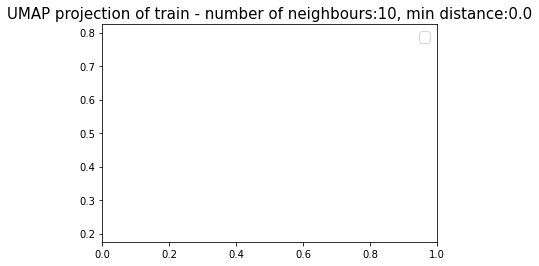

2022-07-31 21:22:59 | INFO | fairseq.tasks.text_to_speech | Please install tensorboardX: pip install tensorboardX
2022-07-31 21:22:59 | INFO | fairseq.file_utils | loading archive file /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed


/mnt/good/gayane/data/chkpt/BBBP_bs_16_dropout_0.1_lr_3e-5_totalNum_1020_warmup_163_noise_type_uniform_r3f_lambda_1.0/checkpoint_best.pt


2022-07-31 21:23:16 | INFO | fairseq.tasks.sentence_prediction | [input] dictionary: 1026 types
2022-07-31 21:23:16 | INFO | fairseq.tasks.sentence_prediction | [label] dictionary: 9 types
2022-07-31 21:23:21 | INFO | fairseq.models.bart.model | Registering classification head: sentence_classification_head
2022-07-31 21:23:25 | INFO | fairseq.data.data_utils | loaded 1,631 examples from: /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed/input0/train
2022-07-31 21:23:25 | INFO | fairseq.data.data_utils | loaded 1,631 examples from: /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed/label/train
2022-07-31 21:23:25 | INFO | fairseq.data.data_utils | loaded 1,631 examples from: /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed/label/train
100%|██████████| 1631/1631 [00:39<00:00, 41.68it/s]
2022-07-31 21:24:04 | INFO | fairseq.data.data_utils | loaded 204 examples from: /home/gayane/BartLM/Bart/chemical/checkpoi

In [8]:
from rdkit.Chem.Scaffolds.MurckoScaffold import MurckoScaffoldSmiles
from fairseq.data.data_utils import load_indexed_dataset
from fairseq.models.bart import BARTModel
from fairseq.data import Dictionary
import torch.nn.functional as F 
import matplotlib.pyplot as plt
from itertools import chain
from pathlib import Path
from rdkit import Chem
import torch.nn as nn
from tqdm import tqdm
import networkx as nx
import seaborn as sns
import pandas as pd
import numpy as np
import umap.plot
import logging
import torch
import json
import umap
import os

# os.system['MKL_THREADING_LAYER'] = 'GNU'
# os.system('CUDA_LAUNCH_BLOCKING=1')
# os.environ["PYTORCH_CUDA_ALLOC_CONF"]="5"



def generateMurcoScaffold(df):
        include_chirality = False
        _scaff = []
        for i in range(len(df)):
                mol = Chem.MolFromSmiles(df['SMILES'][i])
                _scaff.append(MurckoScaffoldSmiles(mol=mol, includeChirality=include_chirality))
        df["MurckoScaffold"] = _scaff
        df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

        return df
def choose_n_to_k(n):
    l = list()
    for i in range(1, n+1):
        for j in range(i+1, n+1):
            l.append((i-1, j-1))
    return l

def add_edge_to_graph(G, e1, e2):
    G.add_edge(e1, e2)



dataset_name = 'BBBP'
# dataset = dataset_name if dataset_name in set(["BBBP", "BACE", "HIV"]) else f"{dataset_name}_{args.subtask}"
dataset = dataset_name

store_path = "/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data"
model = f"{store_path}/{dataset}/processed"

with open('/home/gayane/BartLM/captum/fairseq/scripts/datasets.json') as f:
    datasets_json = json.load(f)
dataset_js = datasets_json[dataset]
task_type = dataset_js['type']

if task_type == "regression":
    mi = dataset_js['minimum']
    ma = dataset_js['maximum']

os.system(f"mkdir -p {store_path}/{dataset}/")
os.system(f"mkdir -p {store_path}/{dataset}/processed/")
os.system(f"mkdir -p {store_path}/{dataset}/processed/input0/")
os.system(f"mkdir -p {store_path}/{dataset}/processed/label/")

warmup = 163
totNumUpdate = 1020
lr = '3e-5'
chkpt_path = '/mnt/good/gayane/data/chkpt/BBBP_bs_16_dropout_0.1_lr_3e-5_totalNum_1020_warmup_163_noise_type_uniform_r3f_lambda_1.0/checkpoint_best.pt'
# chkpt_path = f"/mnt/good/gayane/data/chkpt/{dataset}_bs_16_lr_{lr}_totalNum_{totNumUpdate}_warmup_{warmup}/checkpoint_last.pt"
print(chkpt_path)  # BACE_bs_16_lr_3e-5_totalNum_1135_warmup_181/ in test 
bart = BARTModel.from_pretrained(model,  checkpoint_file = chkpt_path, 
                                 bpe="sentencepiece",
                                 sentencepiece_model="/home/gayane/BartLM/Bart/chemical/tokenizer/chem.model")

input_dict = Dictionary.load(f"{store_path}/{dataset}/processed/input0/dict.txt")

bart.eval()
bart.cuda(device=1)


data_type = 'train'
def get_data(data_type):
    input_dict = Dictionary.load(f"{store_path}/{dataset}/processed/input0/dict.txt")
    smiles = list(load_indexed_dataset(
        f"{store_path}/{dataset}/processed/input0/{data_type}", input_dict))


    test_label_path = f"{store_path}/{dataset}/processed/label/{data_type}"

    if task_type == 'classification':
        
        target_dict = Dictionary.load(f"{store_path}/{dataset}/processed/label/dict.txt")
        targets = list(load_indexed_dataset(test_label_path, target_dict))
    elif task_type == 'regression':
        with open(f'{test_label_path}.label') as f:
            lines = f.readlines()
            targets = [float(x.strip()) for x in lines]
    if task_type == 'classification':
        if len(dataset_js["class_index"])>1:
            target_dict = list()
            targets_list = list()
            for i in range(len(dataset_js["class_index"])):
                target_dict.append(Dictionary.load(f"{store_path}/{dataset}_{i}/processed/label/dict.txt"))
                targets_list.append(list(load_indexed_dataset(test_label_path[i], target_dict[i])))
            
        else: 
            target_dict = Dictionary.load(f"{store_path}/{dataset}/processed/label/dict.txt")
            targets = list(load_indexed_dataset(test_label_path, target_dict))
    elif task_type == 'regression':
        with open(f'{test_label_path}.label') as f:
            lines = f.readlines()
            targets = [float(x.strip()) for x in lines]

    y_pred = []
    y = []
    sm = []
    for i, (smile, target) in tqdm(list(enumerate(zip(smiles, targets)))):
        smile = torch.cat((torch.cat((torch.tensor([0]), smile[:126])), torch.tensor([2]))).to("cuda:1")  
        if task_type =="classification":
            output = bart.predict('sentence_classification_head', smile)
            target = target[0].item()
            y_pred.append(output[0][1].exp().item())
            y.append(target - 4)
            sm.append(smile)
            
        elif task_type == "regression":
            output = bart.predict('sentence_classification_head', smile, return_logits=True)
            y_pred.append(output[0][0].item())
            y.append(target)
            sm.append(smile)
    return sm, targets


sm_train, targets_train = get_data("train")
sm_valid, targets_valid = get_data("valid")
sm_test, targets_test = get_data("test")


smi = []


def get_feautures(sm):
    umap_X = []
    # torch.cuda.empty_cache()
    with torch.no_grad():
        for i in sm:
            last_layer_features = bart.extract_features(i)
            last_layer_feat_mean = torch.mean(last_layer_features, 1)
            umap_X.append(last_layer_feat_mean.to("cpu"))
    return umap_X

umap_X_train = get_feautures(sm_train)
umap_X_valid = get_feautures(sm_valid)
umap_X_test = get_feautures(sm_test)


umap_X_train = [i.numpy() for i in umap_X_train]
umap_X_valid = [i.numpy() for i in umap_X_valid]
umap_X_test = [i.numpy() for i in umap_X_test]

targets_train = [0 if i[0].item() == 5 else 1 for i in targets_train]
targets_valid = [0 if i[0].item() == 5 else 1 for i in targets_valid]
targets_test = [0 if i[0].item() == 5 else 1 for i in targets_test]

_target_train = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/train.target", names=['target'], header=None)
_target_valid = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/valid.target", names=['target'], header=None)
_target_test = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/test.target", names=['target'], header=None)
_input_train = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/train.input", header=None)
_input_valid = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/valid.input", header=None)
_input_test = pd.read_csv(f"/home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/raw/test.input", header=None)


train_df = pd.concat([_input_train, _target_train], axis=1, join="inner")
train_df = train_df.rename(columns={0: "SMILES"})
valid_df = pd.concat([_input_valid, _target_valid], axis=1, join="inner")
valid_df = valid_df.rename(columns={0: "SMILES"})
test_df = pd.concat([_input_test, _target_test], axis=1, join="inner")
test_df = test_df.rename(columns={0: "SMILES"})

train_df = generateMurcoScaffold(train_df)
valid_df = generateMurcoScaffold(valid_df)
test_df = generateMurcoScaffold(test_df)


df = pd.concat([train_df, valid_df, test_df],
               keys=['train', 'valid', 'test']).reset_index()

df = pd.concat([train_df, valid_df, test_df],
               keys=['train', 'valid', 'test']).reset_index()
X_list = [umap_X_train, umap_X_valid, umap_X_test]
X = list(chain.from_iterable(X_list))
X = np.array(X)
X = X.reshape(2039, 1024)


subset = "train"
pooling="avg"
log_save_dir = Path(f"./umap-graph-all/{pooling}")
log_save_dir.mkdir(parents=True, exist_ok=True)
n_neighbors = [10, 40, 80, 100]
min_dists = [0.4, 0.6, 0.8, 1]
# tar = [0 if i[0].item() == 5 else 1 for i in targets]


col_train = ["green" if i==1 else "purple" for i in train_df.target.to_list()]
col_valid = ["y" if i==1 else "brown" for i in valid_df.target.to_list()]
col_test = ["darkred" if i==1 else "darkblue" for i in test_df.target.to_list()]


col = list(chain.from_iterable([col_train, col_valid, col_test]))
node_shape = ["o" if i==1 else "v" for i in df.target.to_list()]

for n_neighbor in n_neighbors:
    for min_dist in min_dists:
        reducer = umap.UMAP(
            n_components=2, min_dist=min_dist, n_neighbors=n_neighbor, transform_seed=5, verbose=False
        ).fit(X)
        X_umap_ = reducer.transform(X)
        data = {
                "x": X_umap_[:, 0].tolist(),
                "y": X_umap_[:, 1].tolist(),
                "label": df["target"].values,
                "MurckoScaffold": df["MurckoScaffold"].values
            }
        df_ = pd.DataFrame(data=data)
        
        nodes = np.arange(df_.shape[0])
        
        G = nx.Graph()
        G.add_nodes_from(nodes)
        pos = [[df_['x'][i], df_['y'][i]] for i in range(df_.shape[0])]
        # pos = nx.spring_layout(G)
        all_datasets = list(set(df_["MurckoScaffold"]))
        edges = []
        for i in all_datasets:
            A = df[df['MurckoScaffold'] == i]
            # print("--->", A.index.to_list())
            n_ = A.shape[0] # number of scaffold types
            idx = [k for k in range(n_)]
            A['idx'] = idx
            ed_p = A.index.to_list()
            for i in range(len(ed_p)):
                for j in range(i + 1, len(ed_p)):
        
                    edges.append((ed_p[i], ed_p[j]))
        
        # print(edges)
        for i in range(len(edges)):
        
            add_edge_to_graph(G, edges[i][0], edges[i][1])
        
        fig, ax = plt.subplots()

        nx.draw_networkx(G, pos=pos, ax=ax, node_size=40, edge_color="lightgrey", linewidths=0.2, node_color=col, alpha=0.2, width=0.2,  node_shape='o', with_labels=False)
        
        plt.axis("on")
        ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=False)
        
        # plt.savefig(log_save_dir.joinpath(f"{subset}-{n_neighbor}-{min_dist}.pdf"))
        plt.savefig(log_save_dir.joinpath(f"{subset}-{n_neighbor}-{min_dist}.png"))

        plt.clf()

        # plt.show()

2022-08-16 16:01:43 | INFO | fairseq.file_utils | loading archive file /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed


/mnt/good/gayane/data/chkpt/BBBP_bs_16_dropout_0.1_lr_3e-5_totalNum_1020_warmup_163_noise_type_uniform_r3f_lambda_1.0/checkpoint_best.pt


2022-08-16 16:02:09 | INFO | fairseq.tasks.sentence_prediction | [input] dictionary: 1026 types
2022-08-16 16:02:09 | INFO | fairseq.tasks.sentence_prediction | [label] dictionary: 9 types
2022-08-16 16:02:13 | INFO | fairseq.models.bart.model | Registering classification head: sentence_classification_head
2022-08-16 16:02:18 | INFO | fairseq.data.data_utils | loaded 1,631 examples from: /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed/input0/train
2022-08-16 16:02:18 | INFO | fairseq.data.data_utils | loaded 1,631 examples from: /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed/label/train
2022-08-16 16:02:18 | INFO | fairseq.data.data_utils | loaded 1,631 examples from: /home/gayane/BartLM/Bart/chemical/checkpoints/evaluation_data/BBBP/processed/label/train
100%|██████████| 1631/1631 [00:37<00:00, 44.06it/s]
2022-08-16 16:02:55 | INFO | fairseq.data.data_utils | loaded 204 examples from: /home/gayane/BartLM/Bart/chemical/checkpoi

In [34]:
# len(["chocolate" if i==1 else "steelblue" for i in train_df["target"]])
len(col)


2039

NameError: name 'umap_X_train' is not defined

In [27]:

# print(_input_train[0])
# print(len(_input_valid), _input_valid[0])
# print(len(_input_test), _input_test[0])


#################################################################For checking##################################################################################




# train_df = generateMurcoScaffold(train_df)
# X = umap_X.to("cpu")

# X = umap_X.detach().cpu()

# fit_and_plot(X, train_df["target"], train_df["MurckoScaffold"], subset = "train", pooling="avg", umap_fit_policy = 'seperate')



[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not removing hydrogen atom without neighbors
[21:03:10] WARNING: not r

In [29]:
# sum([umap_X_train, umap_X_valid, umap_X_test])
df

,level_0,level_1,SMILES,target,MurckoScaffold
0,train,0,C(=O)(OC(C)(C)C)CCCc1ccc(cc1)N(CCCl)CCCl,1,c1ccccc1
1,train,1,C[C@H](N)Cc1ccccc1,1,c1ccccc1
2,train,2,C[S](=O)(=O)c1ccc(cc1)[C@@H](O)[C@@H](CO)NC(=O...,1,c1ccccc1
3,train,3,CC(N)COc1c(C)cccc1C,1,c1ccccc1
4,train,4,c1(ccccc1)CC,1,c1ccccc1
...,...,...,...,...,...
2034,test,199,Nc1nnc(c(N)n1)c2cccc(Cl)c2Cl,1,c1ccc(-c2cncnn2)cc1
2035,test,200,COc1ccc(Cl)cc1C(=O)NCCc2ccc(cc2)[S](=O)(=O)NC(...,1,O=C(NC1CCCCC1)NS(=O)(=O)c1ccc(CCNC(=O)c2ccccc2...
2036,test,201,Cn1c2CCC(Cn3ccnc3C)C(=O)c2c4ccccc14,1,O=C1c2c([nH]c3ccccc23)CCC1Cn1ccnc1
2037,test,202,CN(C)[C@H]1[C@@H]2C[C@H]3C(=C(O)c4c(O)cccc4[C@...,1,O=C1CC2CC3Cc4ccccc4C=C3C(=O)C2C(=O)C1=CNCN1CCCC1


In [30]:

len(X_list[0])

1631

In [33]:
print(X.shape)

(2039, 1024)


In [34]:
# from sklearn.decomposition import PCA
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


# X_umap_0 = reducer.transform(X_[:500])

# plt.scatter(X_umap_0[:,0], X_umap_0[:,1], alpha=0.3, marker="o")
# X_umap_1 = reducer.transform(X_[500:1000])
# plt.scatter(X_umap_1[:,0], X_umap_1[:,1], alpha=0.2, marker="o", color = "red")
# plt.show()

# X_umap_ = reducer.transform(X_)
# plt.scatter(X_umap_[:,0], X_umap_[:,1], alpha=0.2, marker="o")
# plt.show()

In [35]:
# print(X.shape)
# X_ = np.zeros((1000,10))
# X_[:500, :10] = X[:500, :10]
# X_[500:1000, :10] = X[:500, :10]
# Y = [train_df["target"].values[i] for i in range(500)]
# # Y = train_df["target"].values[:10]
# Y[500:1000] = [train_df["target"].values[i-500] for i in range(500, 1000)]

In [36]:
# X_, Y

In [37]:
# X = X_
# X.shape

In [ ]:
round(torch.cuda.memory_allocated(0)/1024**3,1)

AttributeError: module 'torch.cuda' has no attribute 'device_available'

In [10]:
torch.cuda.get_device_name(1)

'NVIDIA GeForce GTX 1080'

In [1]:
import sklearn.metrics
import pandas as pd
import numpy as np

In [2]:
np_filename = '/home/gayane/BartLM/fairseq/scripts/np_BBBP_preFalse.npy'
df_filename = '/home/gayane/BartLM/fairseq/scripts/df_BBBP_preFalse.csv'

In [3]:
X = np.load(np_filename)
df = pd.read_csv(df_filename)

In [4]:
df.level_0

0       train
1       train
2       train
3       train
4       train
        ...  
2034     test
2035     test
2036     test
2037     test
2038     test
Name: level_0, Length: 2039, dtype: object

In [5]:
X_pairwise = sklearn.metrics.pairwise_distances(X)

In [6]:
np.array(df.target).reshape(-1,1)

array([[1],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# make summary table for just top countries
# top_countries = (
#     data
#     .groupby('Country')
#     .filter(lambda x : len(x) > 500)
#     .groupby(['Country', 'Sport'])
#     .size()
#     .unstack()
#     .fillna(0)
#     )

# make pairwise distance matrix
pairwise_top = pd.DataFrame(
    X_pairwise,
    columns = df.target,
    index = df.level_0
)

# plot it with seaborn
plt.figure(figsize=(100,100))
sns.heatmap(
    pairwise_top,
    cmap='OrRd',
    linewidth=1
)

ModuleNotFoundError: No module named 'seaborn'

<AxesSubplot:>

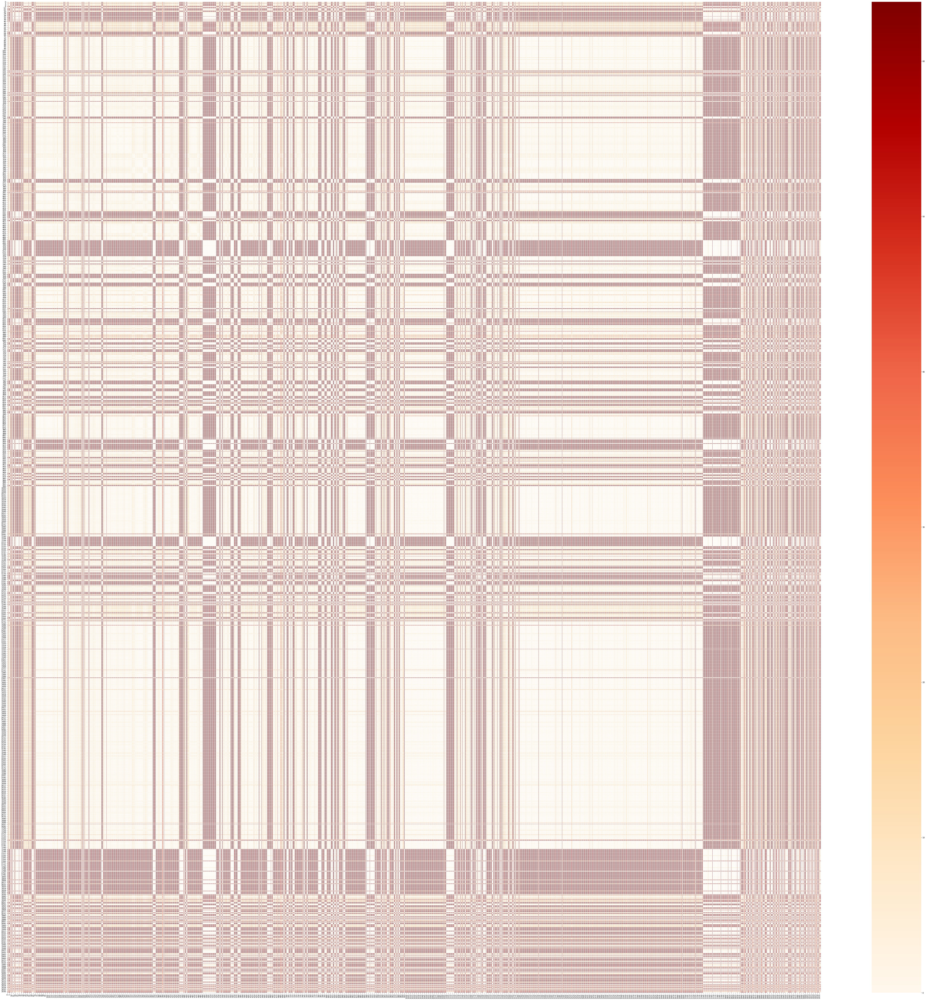

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt


# make pairwise distance matrix
pairwise_top = pd.DataFrame(
    X_pairwise
)

# plot it with seaborn
plt.figure(figsize=(100,100))
sns.heatmap(
    pairwise_top,
    cmap='OrRd',
    linewidth=1
)